In [131]:
#Enkhchimeg Tsendnyam
#Housing Price Prediction 

In [132]:
#Import all the necessary libraries

import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import seaborn as sn
%matplotlib inline

In [133]:
#load data into dataframe

data = pd.read_csv("/Users/Chimpukh/Documents/DSC630/data.csv")

In [134]:
#show the dimension/size

print("The dimension of the dataset is: ", data.shape)

The dimension of the dataset is:  (4600, 18)


In [135]:
#Business Understanding
#display the first 5 rows of dataset

data.head(5)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,5/2/14 0:00,313000,3,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,5/2/14 0:00,2384000,5,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA
2,5/2/14 0:00,342000,3,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,5/2/14 0:00,420000,3,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA
4,5/2/14 0:00,550000,4,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA


In [136]:
#describe the basic stats

print("Describe Data")
print(data.describe())

#Through basic stat description, i've discovered that there are houses that has $0 in terms of cost which is just data mistake

Describe Data
              price     bedrooms    bathrooms   sqft_living      sqft_lot  \
count  4.600000e+03  4600.000000  4600.000000   4600.000000  4.600000e+03   
mean   5.519630e+05     3.400870     2.160815   2139.346957  1.485252e+04   
std    5.638347e+05     0.908848     0.783781    963.206916  3.588444e+04   
min    0.000000e+00     0.000000     0.000000    370.000000  6.380000e+02   
25%    3.228750e+05     3.000000     1.750000   1460.000000  5.000750e+03   
50%    4.609435e+05     3.000000     2.250000   1980.000000  7.683000e+03   
75%    6.549625e+05     4.000000     2.500000   2620.000000  1.100125e+04   
max    2.659000e+07     9.000000     8.000000  13540.000000  1.074218e+06   

            floors   waterfront         view    condition   sqft_above  \
count  4600.000000  4600.000000  4600.000000  4600.000000  4600.000000   
mean      1.512065     0.007174     0.240652     3.451739  1827.265435   
std       0.538288     0.084404     0.778405     0.677230   862.168977

In [137]:
#Cleaning data
#Drop the rows of houses where the cost is $0

drop_0_price=data.index[data["price"] == 0].tolist()
data = data.drop(data.index[drop_0_price])

In [138]:
#Drop the rows of houses with 0 bedrooms

drop_0_bedrooms=data.index[data["bedrooms"] == 0].tolist()
data = data.drop(data.index[drop_0_bedrooms])

In [139]:
#Drop the rows of houses with 0 bathrooms

drop_0_bathrooms=data.index[data["bathrooms"] == 0].tolist()
data = data.drop(data.index[drop_0_bathrooms])

In [140]:
#Show the updated dimension

print("The dimension of the dataset is: ", data.shape)

The dimension of the dataset is:  (4549, 18)


In [141]:
#Show the data types

data.dtypes

date              object
price              int64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
street            object
city              object
statezip          object
country           object
dtype: object

In [142]:
#Clean up some of the columns
#split statezip column into 2 columns

data[['state','zip']] = data.statezip.str.split(" ",expand=True,)

In [143]:
#show the data after splitting 

data.head(5)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country,state,zip
0,5/2/14 0:00,313000,3,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA,WA,98133
1,5/2/14 0:00,2384000,5,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA,WA,98119
2,5/2/14 0:00,342000,3,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA,WA,98042
3,5/2/14 0:00,420000,3,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA,WA,98008
4,5/2/14 0:00,550000,4,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA,WA,98052


In [144]:
#remove duplicate statezip column

data.pop('statezip')

0       WA 98133
1       WA 98119
2       WA 98042
3       WA 98008
4       WA 98052
          ...   
4595    WA 98133
4596    WA 98007
4597    WA 98059
4598    WA 98178
4599    WA 98042
Name: statezip, Length: 4549, dtype: object

In [145]:
#show the data after dropping a duplicate column 

data.head(5)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,country,state,zip
0,5/2/14 0:00,313000,3,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,USA,WA,98133
1,5/2/14 0:00,2384000,5,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,USA,WA,98119
2,5/2/14 0:00,342000,3,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,USA,WA,98042
3,5/2/14 0:00,420000,3,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,USA,WA,98008
4,5/2/14 0:00,550000,4,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,USA,WA,98052


In [146]:
#convert zip data type into intiger

data['zip'] = data['zip'].astype(int)

In [147]:
#check all the data types again
data.dtypes

date              object
price              int64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
street            object
city              object
country           object
state             object
zip                int64
dtype: object

In [148]:
#split date & time column into 2 columns

data[['date','time']] = data.date.str.split(" ",expand=True,)

In [149]:
#drop the time column

data.pop('time')

0       0:00
1       0:00
2       0:00
3       0:00
4       0:00
        ... 
4595    0:00
4596    0:00
4597    0:00
4598    0:00
4599    0:00
Name: time, Length: 4549, dtype: object

In [150]:
#convert the date column into date string

data['date'] = pd.to_datetime(data["date"].astype(str))

In [151]:
#check the data types again

data.dtypes

date             datetime64[ns]
price                     int64
bedrooms                  int64
bathrooms               float64
sqft_living               int64
sqft_lot                  int64
floors                  float64
waterfront                int64
view                      int64
condition                 int64
sqft_above                int64
sqft_basement             int64
yr_built                  int64
yr_renovated              int64
street                   object
city                     object
country                  object
state                    object
zip                       int64
dtype: object

In [152]:
#show the data again

data.head(5)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,country,state,zip
0,2014-05-02,313000,3,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,USA,WA,98133
1,2014-05-02,2384000,5,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,USA,WA,98119
2,2014-05-02,342000,3,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,USA,WA,98042
3,2014-05-02,420000,3,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,USA,WA,98008
4,2014-05-02,550000,4,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,USA,WA,98052


In [153]:
#Check if there is any missing values

data.isnull().values.any()

False

In [154]:
data.isnull()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,country,state,zip
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4595,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4596,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4597,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4598,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [155]:
data.isnull().sum()

date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
street           0
city             0
country          0
state            0
zip              0
dtype: int64

Text(0.5, 1.0, 'Outliers for Price')

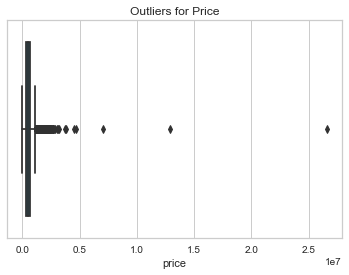

In [156]:
#Detect Outliers
#create a boxplot to detect outliers for prices

sns.boxplot(x=data['price'])
plt.title('Outliers for Price')

In [157]:
#use z-score to detect outliers

z = np.abs(stats.zscore(data['price']))
print(z)

[0.43386461 3.23923179 0.38243062 ... 0.24958194 0.62824963 0.59774395]


In [158]:
#Defining a threshhold to identify an outlier

threshold = 3
print(np.where(z > 3))

(array([   1,  122,  252,  404,  581, 1132, 1543, 1567, 1571, 1600, 1637,
       1858, 2083, 2286, 2328, 2364, 2653, 2711, 2760, 2771, 2979, 3201,
       3282, 3727, 3779, 3789, 3861, 3957, 4133, 4259, 4271, 4344, 4348,
       4439]),)


In [159]:
#Defining another threshhold to identify an outlier

threshold = 5
print(np.where(z > 5))

(array([1637, 2286, 2653, 2760, 3727, 4344, 4348]),)


In [160]:
print(data[['price']].iloc[1637])
print(data[['price']].iloc[2286])
print(data[['price']].iloc[2653])
print(data[['price']].iloc[2760])
print(data[['price']].iloc[3727])
print(data[['price']].iloc[4344])
print(data[['price']].iloc[4348])

price    3710000
Name: 1637, dtype: int64
price    7062500
Name: 2286, dtype: int64
price    4668000
Name: 2654, dtype: int64
price    4489000
Name: 2761, dtype: int64
price    3800000
Name: 3729, dtype: int64
price    12899000
Name: 4346, dtype: int64
price    26590000
Name: 4350, dtype: int64


In [161]:
#Drop the largest 7 outliers

data = data.drop([4350])
data = data.drop([4346]) 
data = data.drop([3729])
data = data.drop([2761])
data = data.drop([2654])
data = data.drop([2286])
data = data.drop([1637])

Text(0.5, 1.0, 'Outliers for Square feet living')

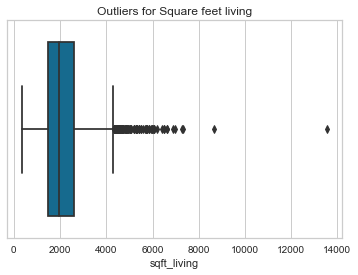

In [162]:
#create a boxplot to detect outliers for sqft living

sns.boxplot(x=data['sqft_living'])
plt.title('Outliers for Square feet living')

In [163]:
#using z-score to detect outliers
z = np.abs(stats.zscore(data['sqft_living']))
print(z)

[0.83969973 1.62937883 0.20906928 ... 0.94530512 0.03805085 0.67936996]


In [164]:
#Defining a threshhold to identify an outlier
threshold = 3
print(np.where(z > 3))

(array([ 122,  252,  418,  452,  462,  471,  581,  634,  839,  847, 1130,
       1132, 1182, 1209, 1302, 1417, 1567, 1584, 1602, 1951, 1961, 2225,
       2326, 2398, 2727, 2841, 2962, 2975, 2999, 3197, 3343, 3553, 3661,
       3763, 3899, 3952, 4025, 4084, 4128, 4131, 4266, 4270, 4276, 4375,
       4377, 4403]),)


In [165]:
#Defining a threshhold to identify an outlier
threshold = 5
print(np.where(z > 5))

(array([ 122,  462, 1567, 2326, 2962, 4131]),)


In [166]:
print(data[['sqft_living']].iloc[122])
print(data[['sqft_living']].iloc[462])
print(data[['sqft_living']].iloc[1567])
print(data[['sqft_living']].iloc[2326])
print(data[['sqft_living']].iloc[2962])
print(data[['sqft_living']].iloc[4131])

sqft_living    13540
Name: 122, dtype: int64
sqft_living    7270
Name: 462, dtype: int64
sqft_living    6980
Name: 1567, dtype: int64
sqft_living    8670
Name: 2328, dtype: int64
sqft_living    6900
Name: 2967, dtype: int64
sqft_living    7320
Name: 4138, dtype: int64


In [167]:
#Drop the largest 7 outliers

data = data.drop([122]) #drop the largest sqft_living outlier 13,540
data = data.drop([462])
data = data.drop([1567])
data = data.drop([2328])
data = data.drop([2967])
data = data.drop([4138])

Text(0.5, 1.0, 'Outliers for Square feet lot')

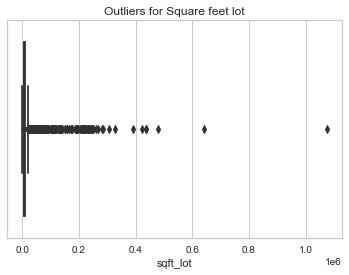

In [168]:
#create a boxplot to detect outliers for sqft lot

sns.boxplot(x=data['sqft_lot'])
plt.title('Outliers for Square feet lot')

In [169]:
#using z-score to detect outliers
z = np.abs(stats.zscore(data['sqft_lot']))
print(z)

[0.18955507 0.15741668 0.07560216 ... 0.21491559 0.22576018 0.18418925]


In [170]:
#Defining a threshhold to identify an outlier
threshold = 3
print(np.where(z > 3))

(array([  56,  107,  239,  253,  271,  374,  460,  477,  482,  493,  677,
        745,  777,  796,  876,  877,  997, 1029, 1076, 1101, 1180, 1259,
       1263, 1270, 1273, 1388, 1404, 1406, 1422, 1537, 1718, 1758, 1782,
       1940, 1958, 2148, 2151, 2153, 2195, 2295, 2473, 2544, 2581, 2723,
       2846, 2863, 2880, 2958, 3046, 3089, 3112, 3249, 3335, 3342, 3391,
       3437, 3459, 3476, 3501, 3514, 3649, 3660, 3689, 3960, 3968, 4049,
       4076, 4221, 4253, 4270, 4338, 4348, 4360]),)


In [171]:
#Defining a threshhold to identify an outlier
threshold = 10
print(np.where(z > 10))

(array([ 374,  877, 1076, 1537, 2473, 3046, 3476]),)


In [172]:
print(data[['sqft_lot']].iloc[374])
print(data[['sqft_lot']].iloc[877])
print(data[['sqft_lot']].iloc[1076])
print(data[['sqft_lot']].iloc[1537])
print(data[['sqft_lot']].iloc[2473])
print(data[['sqft_lot']].iloc[3046])
print(data[['sqft_lot']].iloc[3476])

sqft_lot    435600
Name: 375, dtype: int64
sqft_lot    435600
Name: 879, dtype: int64
sqft_lot    1074218
Name: 1078, dtype: int64
sqft_lot    423838
Name: 1539, dtype: int64
sqft_lot    641203
Name: 2480, dtype: int64
sqft_lot    389126
Name: 3056, dtype: int64
sqft_lot    478288
Name: 3487, dtype: int64


In [173]:
#Drop the largest 7 outliers

data = data.drop([375]) #drop the largest sqft_lot outlier 1074218
data = data.drop([879])
data = data.drop([1078])
data = data.drop([1539])
data = data.drop([2480])
data = data.drop([3056])
data = data.drop([3487])

Text(0.5, 1.0, 'Outliers for Square feet above')

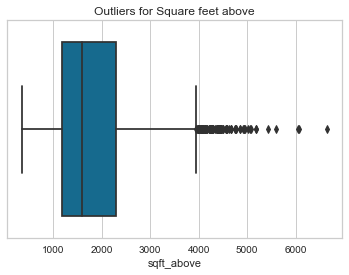

In [174]:
#create a boxplot to detect outliers for sqft above

sns.boxplot(x=data['sqft_above'])
plt.title('Outliers for Square feet above')

In [175]:
#using z-score to detect outliers
z = np.abs(stats.zscore(data['sqft_above']))
print(z)

[0.57081001 1.88892161 0.14408736 ... 1.45271304 0.89796643 0.38905644]


In [176]:
#Defining a threshhold to identify an outlier
threshold = 3
print(np.where(z > 3))

(array([ 107,  216,  232,  251,  416,  575,  578,  631,  672,  961, 1084,
       1123, 1204, 1234, 1270, 1296, 1297, 1355, 1406, 1412, 1564, 1636,
       1714, 1997, 2307, 2423, 2539, 2712, 2718, 2965, 2987, 2989, 3101,
       3109, 3186, 3218, 3332, 3372, 3541, 3677, 3681, 3751, 3756, 3875,
       3887, 3939, 4013, 4042, 4116, 4213, 4241, 4263, 4364, 4390]),)


In [177]:
#Defining a threshhold to identify an outlier
threshold = 5
print(np.where(z > 5))

(array([2718, 3541, 4263]),)


In [178]:
print(data[['sqft_above']].iloc[2718])
print(data[['sqft_above']].iloc[3541])
print(data[['sqft_above']].iloc[4263])

sqft_above    6050
Name: 2731, dtype: int64
sqft_above    6640
Name: 3559, dtype: int64
sqft_above    6070
Name: 4283, dtype: int64


In [179]:
#Drop the largest 3 outliers

data = data.drop([2731]) 
data = data.drop([3559])
data = data.drop([4283])

In [180]:
data

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,country,state,zip
0,2014-05-02,313000,3,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,USA,WA,98133
1,2014-05-02,2384000,5,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,USA,WA,98119
2,2014-05-02,342000,3,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,USA,WA,98042
3,2014-05-02,420000,3,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,USA,WA,98008
4,2014-05-02,550000,4,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,USA,WA,98052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4595,2014-07-09,308167,3,1.75,1510,6360,1.0,0,0,4,1510,0,1954,1979,501 N 143rd St,Seattle,USA,WA,98133
4596,2014-07-09,534333,3,2.50,1460,7573,2.0,0,0,3,1460,0,1983,2009,14855 SE 10th Pl,Bellevue,USA,WA,98007
4597,2014-07-09,416904,3,2.50,3010,7014,2.0,0,0,3,3010,0,2009,0,759 Ilwaco Pl NE,Renton,USA,WA,98059
4598,2014-07-10,203400,4,2.00,2090,6630,1.0,0,0,3,1070,1020,1974,0,5148 S Creston St,Seattle,USA,WA,98178


In [181]:
print("The updated dimension of the dataset is: ", data.shape)

The updated dimension of the dataset is:  (4526, 19)


In [182]:
#describe the basic stats after removing outliers

print("Describe Data")
print(data.describe())

Describe Data
              price     bedrooms    bathrooms  sqft_living       sqft_lot  \
count  4.526000e+03  4526.000000  4526.000000  4526.000000    4526.000000   
mean   5.418188e+05     3.391516     2.147205  2114.244808   13698.871852   
std    3.315980e+05     0.896677     0.756042   897.482147   26668.323536   
min    7.800000e+03     1.000000     0.750000   370.000000     638.000000   
25%    3.259250e+05     3.000000     1.750000  1460.000000    5000.000000   
50%    4.645500e+05     3.000000     2.250000  1970.000000    7651.000000   
75%    6.537500e+05     4.000000     2.500000  2600.000000   10859.500000   
max    3.200000e+06     9.000000     5.750000  6630.000000  327135.000000   

            floors   waterfront         view    condition   sqft_above  \
count  4526.000000  4526.000000  4526.000000  4526.000000  4526.000000   
mean      1.510274     0.006186     0.228237     3.449624  1808.141184   
std       0.537391     0.078419     0.753516     0.675051   817.661175

[Text(0.5, 1.0, 'Bedroom Histogram'),
 Text(0.5, 0, 'Number of Bedrooms'),
 Text(0, 0.5, 'Frequency')]

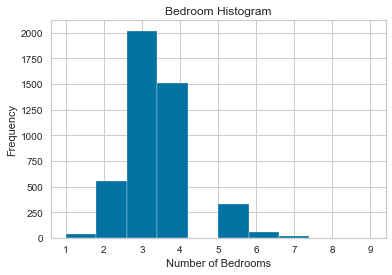

In [183]:
#EDA Analysis

plt.hist(data.bedrooms)
plt.gca().set(title='Bedroom Histogram', xlabel='Number of Bedrooms', ylabel='Frequency')

[Text(0.5, 1.0, 'Bathroom Histogram'),
 Text(0.5, 0, 'Number of Bathrooms'),
 Text(0, 0.5, 'Frequency')]

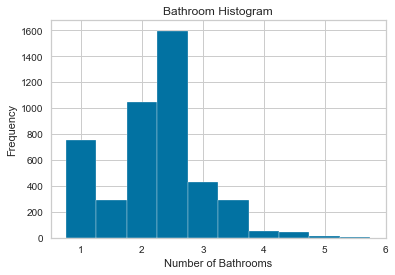

In [184]:
plt.hist(data.bathrooms)
plt.gca().set(title='Bathroom Histogram', xlabel='Number of Bathrooms', ylabel='Frequency')

[Text(0.5, 1.0, 'Floors Histogram'),
 Text(0.5, 0, 'Number of Floors'),
 Text(0, 0.5, 'Frequency')]

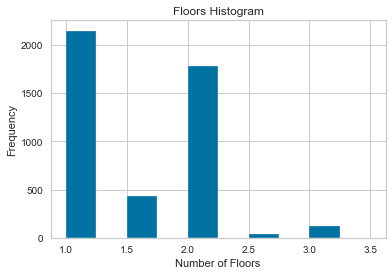

In [185]:
plt.hist(data.floors)
plt.gca().set(title='Floors Histogram', xlabel='Number of Floors', ylabel='Frequency')

[Text(0.5, 1.0, 'Number of houses built Histogram'),
 Text(0.5, 0, 'Year the houses are built'),
 Text(0, 0.5, 'Frequency')]

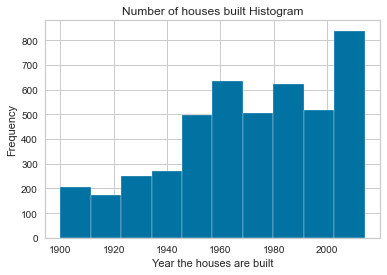

In [186]:
plt.hist(data.yr_built)
plt.gca().set(title='Number of houses built Histogram', xlabel='Year the houses are built', ylabel='Frequency')

[Text(0.5, 1.0, 'Waterfront Histogram'),
 Text(0.5, 0, 'Waterfront '),
 Text(0, 0.5, 'Frequency')]

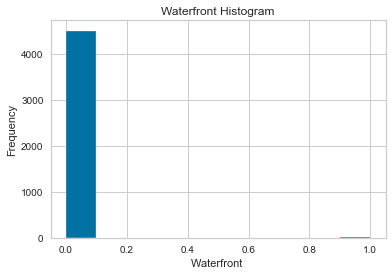

In [187]:
plt.hist(data.waterfront)
plt.gca().set(title='Waterfront Histogram', xlabel='Waterfront ', ylabel='Frequency')

[Text(0.5, 1.0, 'House Condition Histogram'),
 Text(0.5, 0, 'Condition '),
 Text(0, 0.5, 'Frequency')]

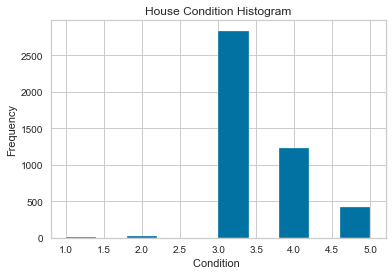

In [189]:
plt.hist(data.condition)
plt.gca().set(title='House Condition Histogram', xlabel='Condition ', ylabel='Frequency')

/Users/Chimpukh/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='sqft_lot', ylabel='Density'>

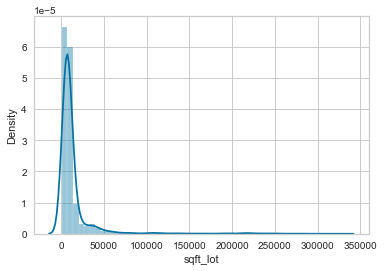

In [193]:
sns.distplot(data['sqft_lot'])

[Text(0.5, 1.0, 'Housing prices by built year'),
 Text(0.5, 0, 'Year the houses are built'),
 Text(0, 0.5, 'Price')]

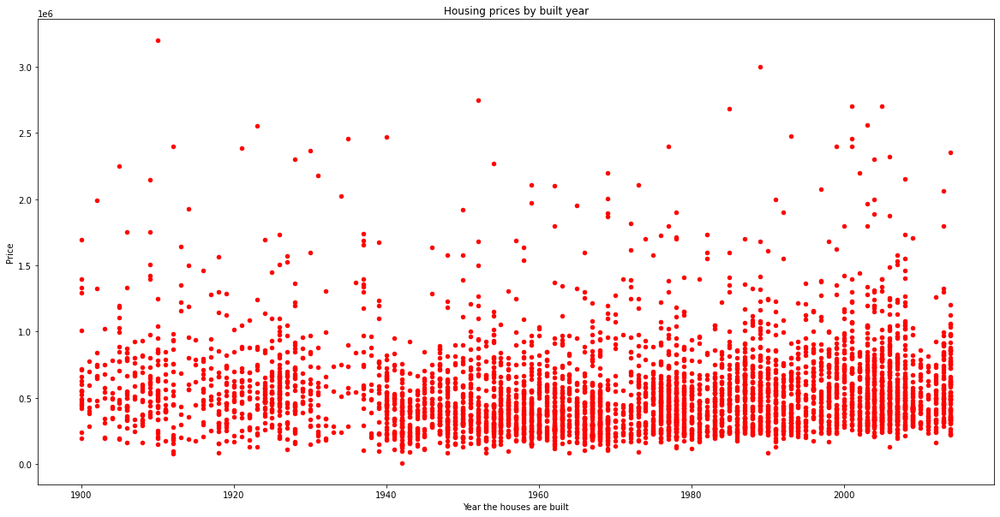

In [57]:
plt.rcParams["figure.figsize"] = (20,10)
data.plot.scatter(x='yr_built', y='price', c='red', colormap='viridis')
plt.gca().set(title='Housing prices by built year', xlabel='Year the houses are built', ylabel='Price')

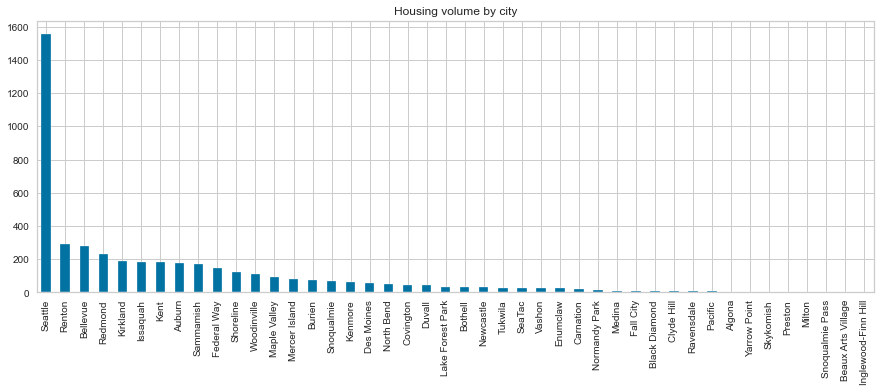

In [194]:
plt.figure(figsize=(15,5))
data['city'].value_counts().plot.bar()
plt.title('Housing volume by city')
plt.show()

In [59]:
data.groupby('city').mean()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,zip
city,,,,,,,,,,,,,,
Algona,2.072880e+05,3.200000,1.900000,1608.600000,11494.200000,1.400000,0.000000,0.000000,3.200000,1608.600000,0.000000,1983.200000,800.400000,98001.000000
Auburn,3.010510e+05,3.417143,2.090000,2019.920000,25075.788571,1.451429,0.000000,0.125714,3.400000,1867.291429,152.628571,1981.080000,729.908571,98044.360000
Beaux Arts Village,7.450000e+05,3.000000,1.750000,1490.000000,9800.000000,1.000000,0.000000,0.000000,4.000000,1140.000000,350.000000,1947.000000,1988.000000,98004.000000
Bellevue,8.270329e+05,3.795699,2.425627,2633.243728,13647.881720,1.390681,0.003584,0.394265,3.605735,2116.935484,516.308244,1973.609319,815.774194,98005.982079
Black Diamond,3.820562e+05,3.125000,1.781250,1807.500000,19529.500000,1.312500,0.000000,0.000000,3.125000,1745.000000,62.500000,1980.000000,1245.750000,98010.000000
Bothell,4.814419e+05,3.606061,2.431818,2319.393939,9060.181818,1.500000,0.000000,0.000000,3.151515,1957.878788,361.515152,1982.696970,727.151515,98011.515152
Burien,3.586402e+05,3.277778,1.736111,1800.486111,12269.736111,1.215278,0.041667,0.527778,3.527778,1476.458333,324.027778,1957.930556,1189.291667,98161.638889
Carnation,5.087520e+05,3.090909,2.170455,2392.454545,64873.772727,1.522727,0.000000,0.318182,3.090909,2205.181818,187.272727,1982.818182,727.318182,98014.000000
Clyde Hill,1.342675e+06,4.250000,2.281250,3227.500000,17658.875000,1.125000,0.000000,0.125000,3.250000,2228.750000,998.750000,1962.250000,1251.500000,98004.000000


In [60]:
from scipy.stats import norm, skew
(mu, sigma) = norm.fit(data['price'])

/Users/Chimpukh/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'SalePrice distribution')

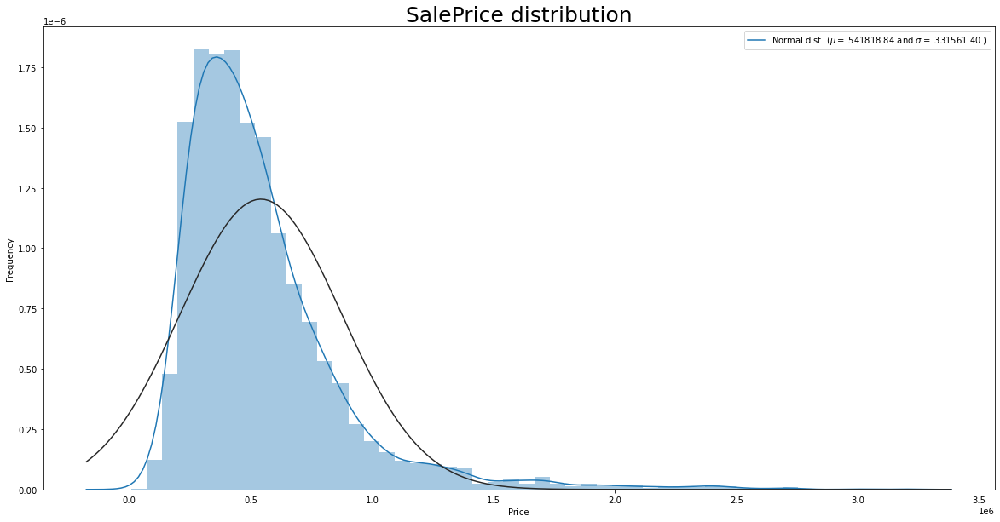

In [61]:
sns.distplot(data['price'] , fit=norm)
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.xlabel('Price')
plt.title('SalePrice distribution', fontsize = 25)

Text(0.5, 1.0, 'Probability Plot')

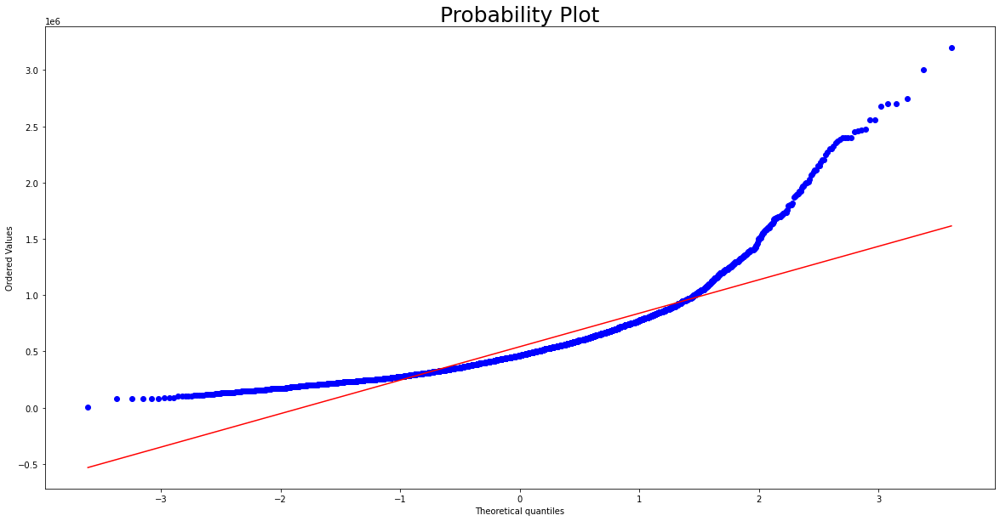

In [62]:
fig = plt.figure()
res = stats.probplot(data['price'], plot=plt)
plt.title('Probability Plot', fontsize = 25)

                  price  bedrooms  bathrooms  sqft_living  sqft_lot    floors  \
price          1.000000  0.337145   0.516499     0.676597  0.079991  0.267372   
bedrooms       0.337145  1.000000   0.538335     0.604916  0.071607  0.175787   
bathrooms      0.516499  0.538335   1.000000     0.751188  0.097697  0.498190   
sqft_living    0.676597  0.604916   0.751188     1.000000  0.218557  0.347115   
sqft_lot       0.079991  0.071607   0.097697     0.218557  1.000000 -0.012948   
floors         0.267372  0.175787   0.498190     0.347115 -0.012948  1.000000   
waterfront     0.178488 -0.015596   0.042412     0.072300  0.025534  0.016846   
view           0.372027  0.105177   0.185596     0.286404  0.051327  0.023679   
condition      0.064271  0.022733  -0.120945    -0.059892 -0.014773 -0.273775   
sqft_above     0.578308  0.485141   0.679074     0.867340  0.233034  0.529533   
sqft_basement  0.299666  0.326085   0.265216     0.419909  0.012506 -0.270843   
yr_built       0.019302  0.1

Text(0.5, 1.0, 'Correlation Matrix')

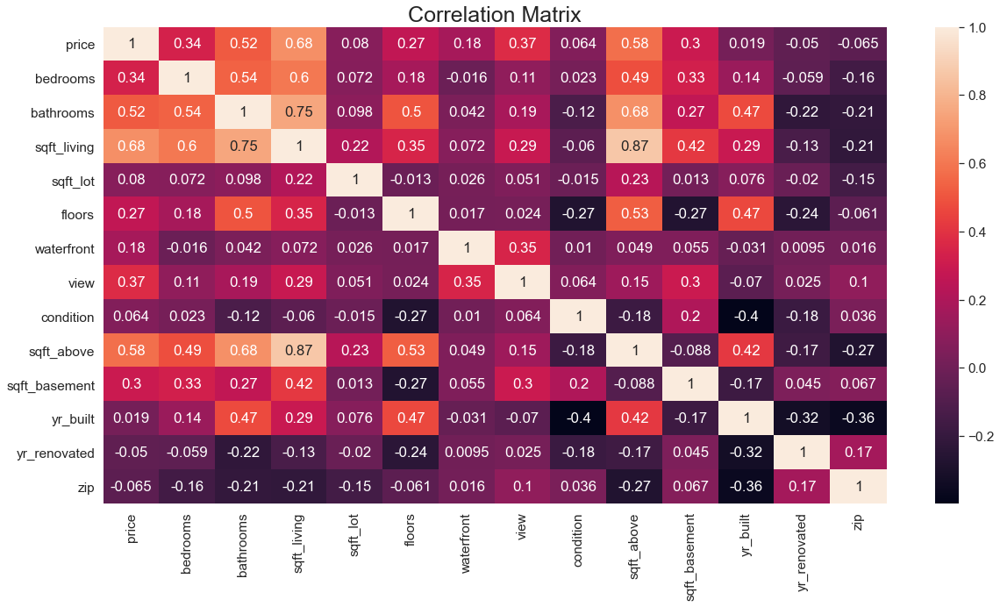

In [63]:
plt.rcParams["figure.figsize"] = (20,10)
df1 = pd.DataFrame(data)
corrMatrix = df1.corr()
print (corrMatrix)
sns.set(font_scale=1.4)
sn.heatmap(corrMatrix, annot=True)
plt.title('Correlation Matrix',fontsize=25)

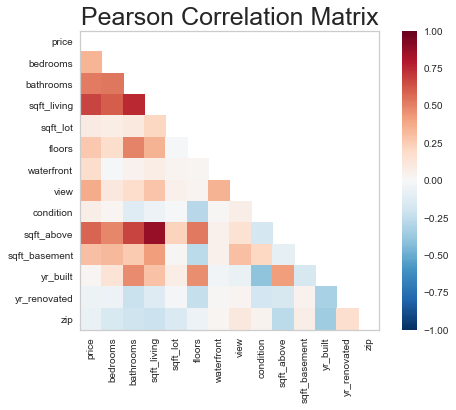

In [64]:
#Step 8: Pearson Ranking
#set up the figure size
#%matplotlib inline
plt.rcParams["figure.figsize"] = (20, 10) 

num_features = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zip' ]

# import the package for visulization of the correlation
import yellowbrick
from yellowbrick.features import Rank2D

# extract the numpy arrays from the data frame
X = data[num_features].to_numpy()
# instantiate the visualizer with the Covariance ranking algorithm
visualizer = Rank2D(features=num_features, algorithm='pearson', )
visualizer.fit(X)                # Fit the data to the visualizer
visualizer.transform(X)             # Transform the data
#visualizer.poof(outpath="d://pcoords1.png") # Draw/show/poof the data
plt.title('Pearson Correlation Matrix',fontsize=25)
plt.show() #show the plot

In [65]:
data.corr()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,zip
price,1.000000,0.337145,0.516499,0.676597,0.079991,0.267372,0.178488,0.372027,0.064271,0.578308,0.299666,0.019302,-0.050300,-0.064910
bedrooms,0.337145,1.000000,0.538335,0.604916,0.071607,0.175787,-0.015596,0.105177,0.022733,0.485141,0.326085,0.140239,-0.058747,-0.156420
bathrooms,0.516499,0.538335,1.000000,0.751188,0.097697,0.498190,0.042412,0.185596,-0.120945,0.679074,0.265216,0.471558,-0.221927,-0.209599
sqft_living,0.676597,0.604916,0.751188,1.000000,0.218557,0.347115,0.072300,0.286404,-0.059892,0.867340,0.419909,0.293085,-0.129300,-0.214912
sqft_lot,0.079991,0.071607,0.097697,0.218557,1.000000,-0.012948,0.025534,0.051327,-0.014773,0.233034,0.012506,0.076295,-0.019737,-0.149456
floors,0.267372,0.175787,0.498190,0.347115,-0.012948,1.000000,0.016846,0.023679,-0.273775,0.529533,-0.270843,0.466506,-0.236832,-0.061441
waterfront,0.178488,-0.015596,0.042412,0.072300,0.025534,0.016846,1.000000,0.346355,0.010063,0.049462,0.054514,-0.031344,0.009530,0.015976
view,0.372027,0.105177,0.185596,0.286404,0.051327,0.023679,0.346355,1.000000,0.064100,0.151207,0.297509,-0.070156,0.024672,0.104565
condition,0.064271,0.022733,-0.120945,-0.059892,-0.014773,-0.273775,0.010063,0.064100,1.000000,-0.177608,0.203989,-0.398511,-0.184856,0.035610
sqft_above,0.578308,0.485141,0.679074,0.867340,0.233034,0.529533,0.049462,0.151207,-0.177608,1.000000,-0.087506,0.415540,-0.166428,-0.272874


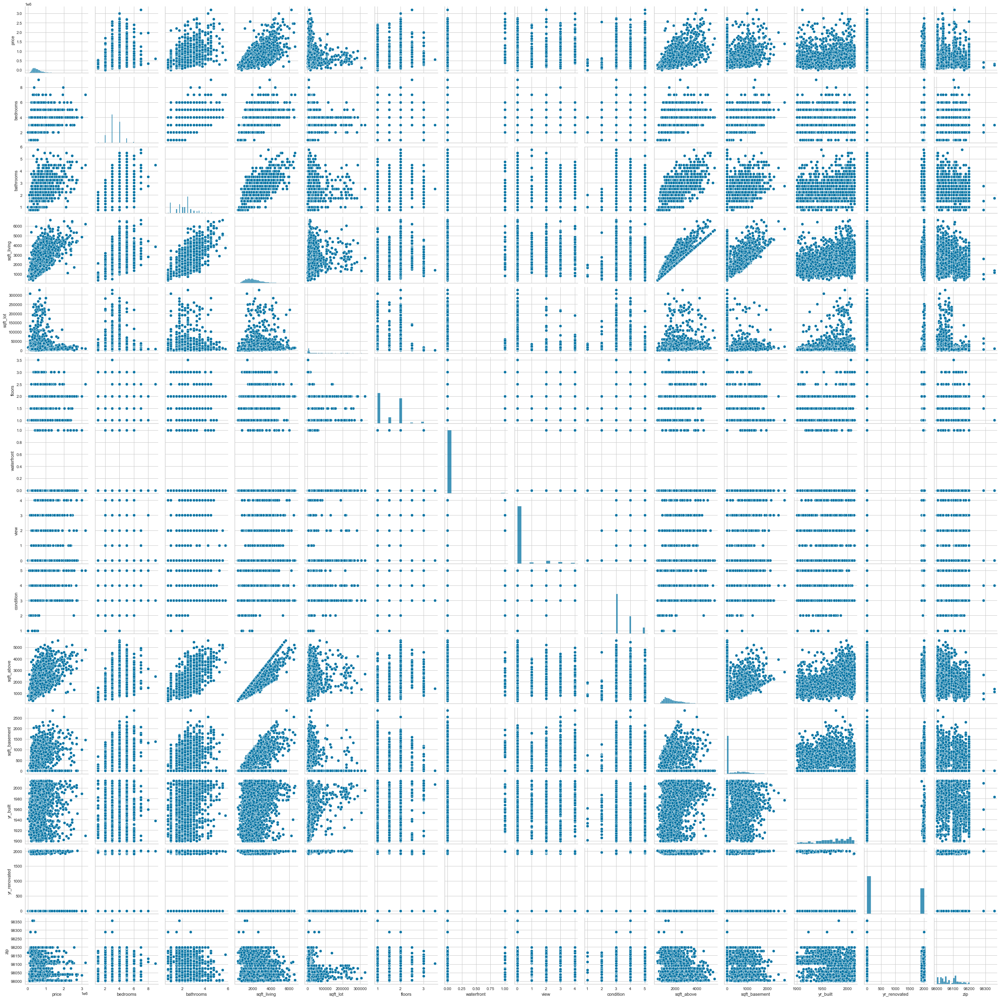

In [65]:
sns.pairplot(data)
plt.show()

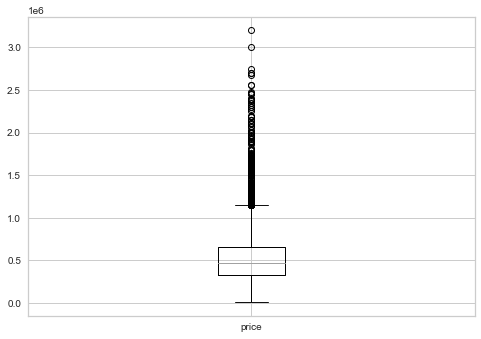

In [66]:
data.boxplot(column = ['price'])
plt.show()

In [67]:
data.dtypes

date             datetime64[ns]
price                     int64
bedrooms                  int64
bathrooms               float64
sqft_living               int64
sqft_lot                  int64
floors                  float64
waterfront                int64
view                      int64
condition                 int64
sqft_above                int64
sqft_basement             int64
yr_built                  int64
yr_renovated              int64
street                   object
city                     object
country                  object
state                    object
zip                       int64
dtype: object

In [68]:
import pandas_profiling as pp
pp.ProfileReport(data)

Summarize dataset:   0%|          | 0/33 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [69]:
#encode the categorical variables:
#state & city 
# preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split

In [70]:
# Determination categorical features
numerics = ['int8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
categorical_columns = []
features = data.columns.values.tolist()
for col in features:
    if data[col].dtype in numerics: continue
    categorical_columns.append(col)

In [71]:
# Encoding categorical features
for col in categorical_columns:
    if col in data.columns:
        le = LabelEncoder()
        le.fit(list(data[col].astype(str).values))
        data[col] = le.transform(list(data[col].astype(str).values))

In [72]:
data.head(5)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,country,state,zip
0,0,313000,3,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,1502,36,0,0,98133
1,0,2384000,5,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,3831,35,0,0,98119
2,0,342000,3,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,2257,18,0,0,98042
3,0,420000,3,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,4193,3,0,0,98008
4,0,550000,4,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,4282,31,0,0,98052


In [73]:
#remove state & country columns
data.pop('state')
data.pop('country')

0       0
1       0
2       0
3       0
4       0
       ..
4595    0
4596    0
4597    0
4598    0
4599    0
Name: country, Length: 4526, dtype: int64

In [74]:
data.pop('date')

0        0
1        0
2        0
3        0
4        0
        ..
4595    68
4596    68
4597    68
4598    69
4599    69
Name: date, Length: 4526, dtype: int64

In [75]:
data

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,zip
0,313000,3,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,1502,36,98133
1,2384000,5,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,3831,35,98119
2,342000,3,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,2257,18,98042
3,420000,3,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,4193,3,98008
4,550000,4,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,4282,31,98052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4595,308167,3,1.75,1510,6360,1.0,0,0,4,1510,0,1954,1979,3386,35,98133
4596,534333,3,2.50,1460,7573,2.0,0,0,3,1460,0,1983,2009,945,3,98007
4597,416904,3,2.50,3010,7014,2.0,0,0,3,3010,0,2009,0,3964,32,98059
4598,203400,4,2.00,2090,6630,1.0,0,0,3,1070,1020,1974,0,3435,35,98178


In [76]:
# separate data into training and test 
# import packages
from sklearn.model_selection import train_test_split

In [77]:
y=data.iloc[:,[0]]
x=data.iloc[:,[1,2,3,4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]]

In [78]:
# split the data using 70:30 ratio
X_train, X_val, y_train, y_val = train_test_split(x, y, test_size =0.33, random_state=1)

In [79]:
# number of samples in each set
print("No. of samples in training set: ", X_train.shape[0])
print("No. of samples in validation set:", X_val.shape[0])

No. of samples in training set:  3032
No. of samples in validation set: 1494


In [80]:
#Machine Learning
#Linear Regression

from sklearn.linear_model import LinearRegression
lr=LinearRegression()
model=lr.fit(x,y)

In [81]:
model.score(x,y)

0.5635514752034911

In [82]:
#display adjusted R-squared
1 - (1-model.score(x, y))*(len(y)-1)/(len(y)-x.shape[1]-1)

0.5620998725711303

In [83]:
#Normalize & fit the training model
lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train,y_train)
print(lin_reg.intercept_)

[52956462.97632637]


In [84]:
#Normalize & fit the training model on Linear Regression
model = LinearRegression(normalize = True).fit(X_train, y_train)
print("The best intercept value in the regression line is:", model.intercept_)

The best intercept value in the regression line is: [52956462.97632637]


In [85]:
print("The best slope values in the regression line are:", model.coef_)

The best slope values in the regression line are: [[-3.89667048e+04  6.00801875e+04  1.22740374e+02 -6.95369140e-01
   5.27791134e+04  3.80615697e+05  6.20963921e+04  2.55616960e+04
   1.23678346e+02  8.28989132e+01 -2.49374988e+03  9.33403133e+00
   1.47941117e+00  2.99321580e+03 -4.92178280e+02]]


In [86]:
#check the goodness to fit on a test data; 
print("Coefficient of determination or R2 on test data is:", model.score(X_val, y_val))

Coefficient of determination or R2 on test data is: 0.5429731768530781


In [87]:
#check the goodness to fit on a training data
print("Coefficient of determination or R2 on training data is:", model.score(X_train, y_train))

Coefficient of determination or R2 on training data is: 0.5719738580578404


In [88]:
#Predict the housing prices
prediction = lin_reg.predict(X_val)
prediction

array([[657991.36764079],
       [585683.18723796],
       [643566.03514999],
       ...,
       [378689.77967394],
       [868670.13106997],
       [521169.85676902]])

/Users/Chimpukh/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Distance between actual values vs. predicted values using Linear Regression')

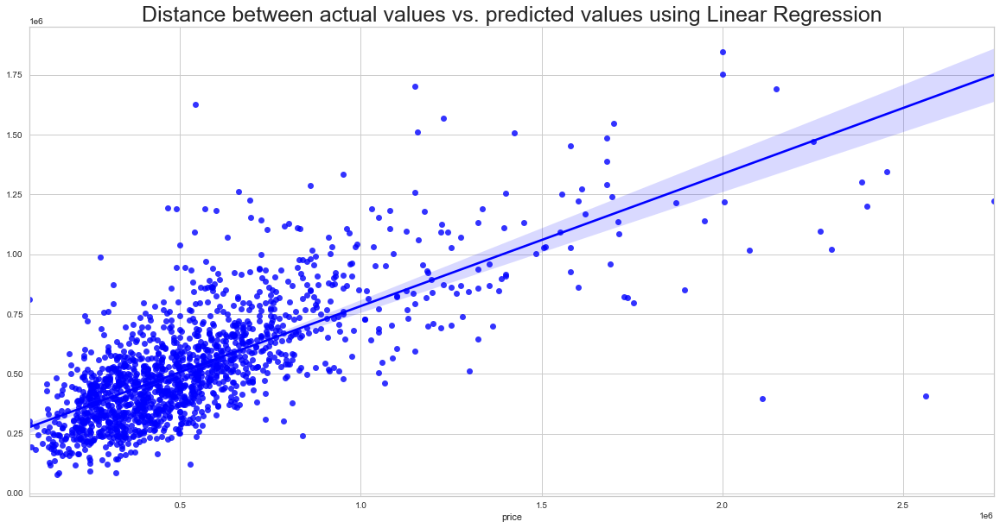

In [89]:
plt.rcParams["figure.figsize"] = (20,10)
sns.regplot(y_val, prediction, color='Blue')
plt.title('Distance between actual values vs. predicted values using Linear Regression', fontsize = 25)

In [90]:
from sklearn.metrics import mean_squared_error

In [91]:
#Model MSE with LinearRegression model 
MSE = mean_squared_error(y_val, prediction)
MSE

50899518034.98586

In [92]:
#Model RMSE with LinearRegression model 
RMSE= np.sqrt(MSE)
RMSE

225609.21531485778

In [93]:
#Model Accuracy with Regression model 
model_accuracy =lin_reg.score(X_train, y_train)
print(model_accuracy)

0.5719738580578404


In [94]:
#Model MAE with LinearRegression model 

from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_val, prediction)
mae

149848.5483782903

In [95]:
#GradientBoostingRegressor model
#fit the training model on GradientBoostingRegressor
#Model Accuracy with GradientBoostingRegressor model 

from sklearn.ensemble import GradientBoostingRegressor
model = GradientBoostingRegressor(random_state=0).fit(X_train, y_train)
model.score(X_train, y_train)

/Users/Chimpukh/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


0.8227076329298062

In [96]:
#Model Accuracy with GradientBoostingRegressor model 

model.score(X_val, y_val)

0.6841582522427041

In [97]:
prediction_gradboost = model.predict(X_val)
prediction_gradboost

array([715281.79134699, 695494.48786628, 814292.28579671, ...,
       248401.762816  , 886667.52055861, 495476.46479535])

/Users/Chimpukh/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Distance between actual values vs. predicted values using GradientBoosting Regressor')

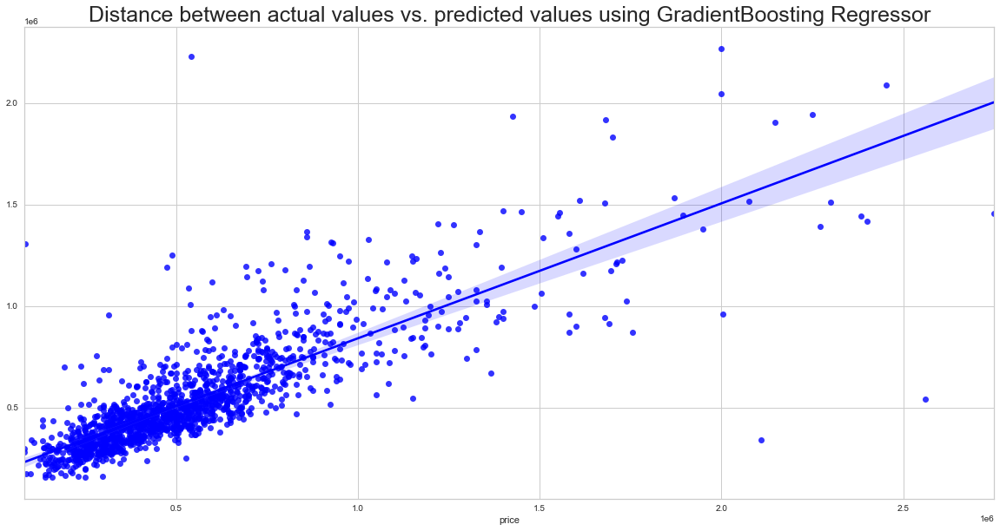

In [98]:
plt.rcParams["figure.figsize"] = (20,10)
sns.regplot(y_val, prediction_gradboost, color='Blue')
plt.title('Distance between actual values vs. predicted values using GradientBoosting Regressor', fontsize = 25)

In [99]:
#Model MSE with GradientBoostingRegressor model 

MSE = mean_squared_error(y_val, prediction_gradboost)
MSE

35175600034.761795

In [100]:
#Model RMSE with GradientBoostingRegressor model 

RMSE= np.sqrt(MSE)
RMSE

187551.5929944659

In [101]:
#Model MAE with GradientBoostingRegressor model 

mae = mean_absolute_error(y_val, prediction_gradboost)
mae

112848.32824870858

In [102]:
#RandomForestRegressor Model
#fit the training model on RandomForest

from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(random_state=0).fit(X_train, y_train)
model.score(X_train, y_train)

<ipython-input-102-63aa75b538d5>:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model = RandomForestRegressor(random_state=0).fit(X_train, y_train)


0.9530115111153834

In [103]:
model.score(X_val, y_val)

0.6762286139881519

In [104]:
prediction_randomforestreg = model.predict(X_val)
prediction_randomforestreg

array([655412.15, 765415.29, 745151.57, ..., 263042.67, 820598.06,
       477446.75])

/Users/Chimpukh/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Distance between actual values vs. predicted values using Random Forest Regression')

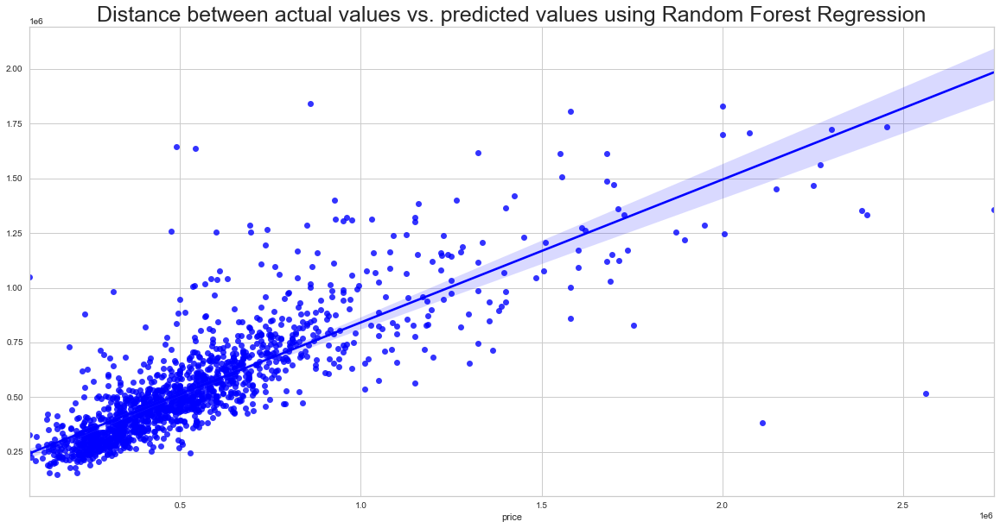

In [105]:
plt.rcParams["figure.figsize"] = (20,10)
sns.regplot(y_val, prediction_randomforestreg, color='Blue')
plt.title('Distance between actual values vs. predicted values using Random Forest Regression', fontsize = 25)

In [106]:
#Model MSE with RandomForestRegressor model 

MSE = mean_squared_error(y_val, prediction_randomforestreg)
MSE

36058731494.24451

In [107]:
#Model RMSE with RandomForestRegressor model 

RMSE= np.sqrt(MSE)
RMSE

189891.36761381364

In [108]:
#Model MAE with RandomForestRegressor model 

mae = mean_absolute_error(y_val, prediction_randomforestreg)
mae

110817.18345604642

In [109]:
#RanSacRegressor Model

from sklearn.linear_model import RANSACRegressor
model = RANSACRegressor(random_state=0).fit(X_train, y_train)
model.score(X_train, y_train)

0.44381881815716717

In [110]:
model.score(X_val, y_val)

0.468672277254508

In [111]:
prediction_ransocregressor = model.predict(X_val)
prediction_ransocregressor

array([[615794.76968338],
       [668263.88427965],
       [324837.13046357],
       ...,
       [505682.20597298],
       [707890.09607825],
       [530150.60248065]])

/Users/Chimpukh/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Distance between actual values vs. predicted values using RanSac Regression')

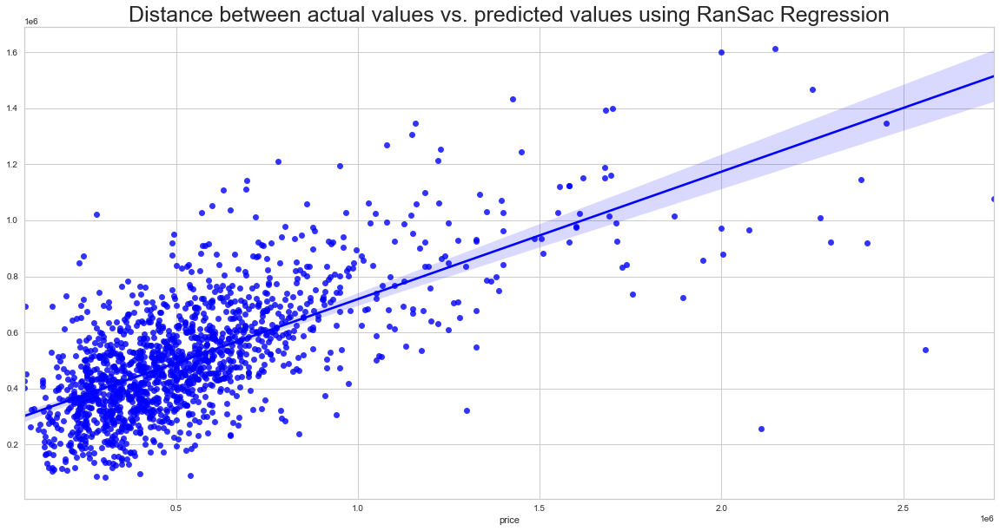

In [112]:
plt.rcParams["figure.figsize"] = (20,10)
sns.regplot(y_val, prediction_ransocregressor, color='Blue')
plt.title('Distance between actual values vs. predicted values using RanSac Regression', fontsize = 25)

In [113]:
#Model MSE with RansacRegressor model 

MSE = mean_squared_error(y_val, prediction_ransocregressor)
MSE

59174480876.53734

In [114]:
#Model RMSE with RansacRegressor model 

RMSE= np.sqrt(MSE)
RMSE

243258.05408359523

In [115]:
#Model MAE with RansacRegressor model 

mae = mean_absolute_error(y_val, prediction_ransocregressor)
mae

163667.1824733633

In [116]:
#Decision Tree Regressor Model

from sklearn.tree import DecisionTreeRegressor
model = DecisionTreeRegressor(random_state=0).fit(X_train, y_train)
model.score(X_train, y_train)

0.9999952643799919

In [117]:
model.score(X_val, y_val)

0.33597193635921574

In [118]:
prediction_decisiontreeregressor = model.predict(X_val)
prediction_decisiontreeregressor

array([994000., 940000., 740000., ..., 272000., 769900., 485000.])

/Users/Chimpukh/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Distance between actual values vs. predicted values using DecisionTree Regressor')

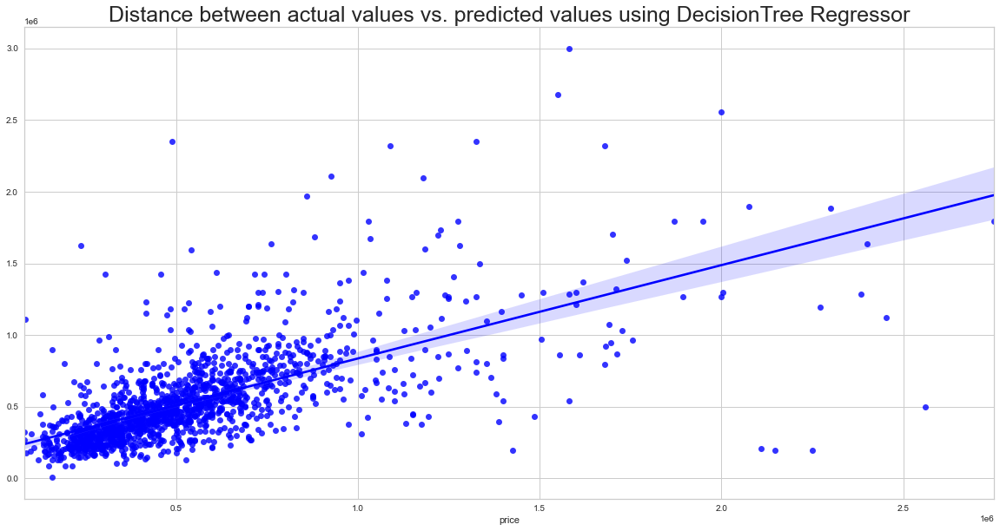

In [119]:
plt.rcParams["figure.figsize"] = (20,10)
sns.regplot(y_val, prediction_decisiontreeregressor, color='Blue')
plt.title('Distance between actual values vs. predicted values using DecisionTree Regressor', fontsize = 25)

In [120]:
#Model MSE with DecisionTreeRegressor model 

MSE = mean_squared_error(y_val, prediction_decisiontreeregressor)
MSE

73953445813.73828

In [121]:
#Model RMSE with DecisionTreeRegressor model 

RMSE= np.sqrt(MSE)
RMSE

271943.8284163446

In [122]:
#Model MAE with DecisionTreeRegressor model 

mae = mean_absolute_error(y_val, prediction_decisiontreeregressor)
mae

161269.74765729584